# Notes:

 - There are 4 channels:     
        - Ch2-T1 - red   
        - ChS2-T2 - yellow   
        - ChS1-T3  - green   
        - Ch1-T4 - cyan    

- There should be fewer than 200 cells per image, as few as 4.

- Cells should exists for 1 or combinations 2 colors (not 3 or 4) - lineages will share there colors

- We expect a color combination becomes the dominant lineage 

- Need to check same resolution and same area on the plate

- Only compare same group (control) on same day
"""

In [186]:
import pandas as pd
import numpy as np
import os
from math import sqrt
import numba
from importlib import reload

import skimage
from skimage import io
from skimage.color import rgb2gray
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.morphology import reconstruction
from skimage import color, morphology

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

# locals
import blob_detection as _blob
import utils as _tools

In [202]:
%time 
reload(_tools)

exp = _tools.FileLoader("../test_data/")
exp.df.head()

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 8.82 µs


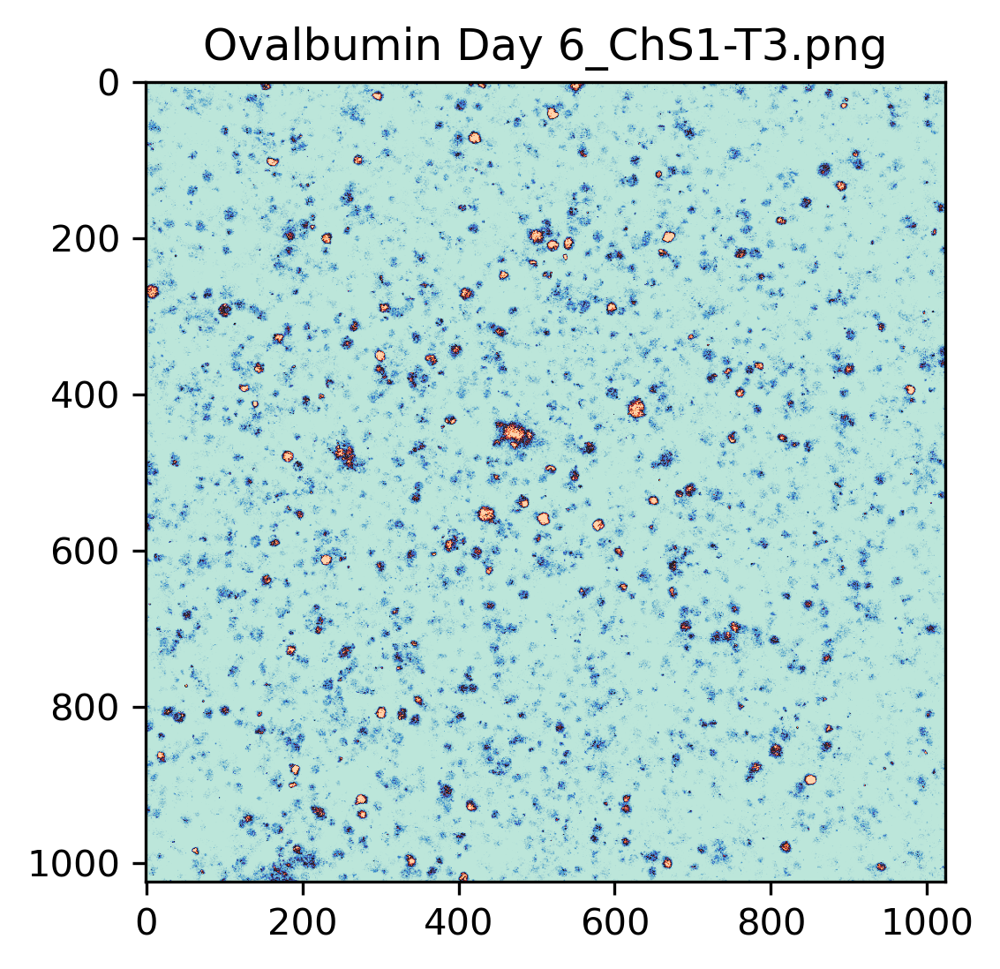

In [188]:
matplotlib.rcParams['figure.dpi'] = 300

plt.axis_off = True
rand_img = np.random.randint(0, len(exp.df) - 1)
plt.imshow(exp.df.iloc[rand_img]['image'], cmap='icefire')
plt.title(str(exp.df.iloc[rand_img]['filename']))

plt.savefig("figs/_example_image_icefire.png")


In [189]:
# exp.df['channel'].value_counts()
exp.df.head()

# exp.df['channel'].unique()

,channel,day,filename,group,image
0,Ch2-T1,12,Control Day 12_Ch2-T1.png,Control,"[[0.0075, 0.0016666666666666666, 0.00166666666..."
1,ChS2-T2,4,Lysozyme Day 4_ChS2-T2.png,Lysozyme,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0400270..."
2,ChS2-T2,9,Control Day 9_ChS2-T2.png,Control,"[[0.0, 0.02183294117647059, 0.0218329411764705..."
3,Ch1-T4,14,Ovalbumin Day 14_Ch1-T4.png,Ovalbumin,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,Ch1-T4,12,Lysozyme Day 12_Ch1-T4.png,Lysozyme,"[[0.018529411764705885, 0.052500000000000005, ..."


Text(0.5, 1.0, 'cells n=33')

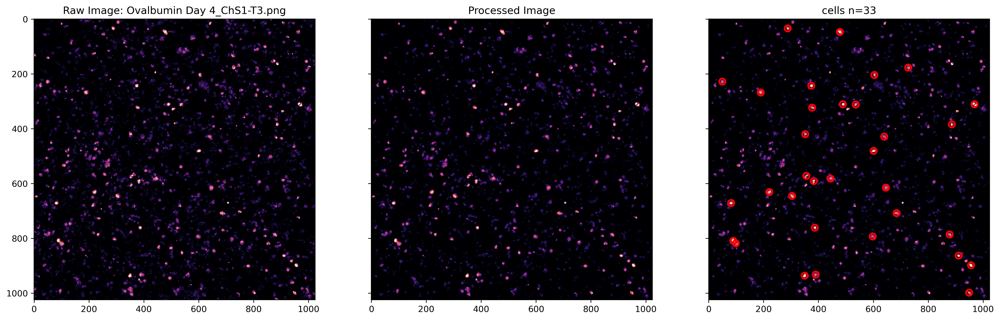

In [190]:
reload(_blob)

"""
Save Figures for all
"""

CMAP = 'magma'

test = exp.df[exp.df['channel'] == 'ChS1-T3']
test = test[test['group'] == 'Ovalbumin']

sample = test.sample(1).iloc[0]

test_img = sample['image']
filname = sample['filename']
channel = sample['channel']

matplotlib.rcParams['figure.dpi'] = 300
f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(20, 20))
ax1.imshow(test_img, cmap=CMAP) 
ax1.set_title(f"Raw Image: {filname}")

test_img = _blob.preprocess_image(test_img, channel)
ax2.imshow(test_img, cmap=CMAP)
ax2.set_title("Processed Image")

blobs = _blob.get_LoG_blobs(test_img, channel)
ax3.imshow(test_img, cmap=CMAP)

for blob in blobs:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
    ax3.add_patch(c)

ax3.set_title(f"cells n={len(blobs)}")
# plt.savefig(f"figs/{filname}.png", bbox_inches='tight') 


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs
/opt/anaconda3/lib/python3.7/site-packages/skimage/feature/blob.py:125: RuntimeWarning: invalid value encountered in double_scalars
  r1 = blob1[-1] / blob2[-1]
/opt/anaconda3/lib/python3.7/site-packages/skimage/feature/blob.py:126: RuntimeWarning: divide by zero encountered in true_divide
  pos1 = blob1[:ndim] / (max_sigma * root_ndim)
/opt/anaconda3/lib/python3.7/site-packages/skimage/feature/blob.py:127: RuntimeWarning: divide by zero encountered in true_divide
  pos2 = blob2[:ndim] / (max_sigma * root_ndim)
/opt/anaconda3/lib/python3.7/site-packages/skimage/feature/blob.py:129: RuntimeWarning: invalid value encountered in subtract
  d = np.sqrt(np.sum((pos2 - pos1)**2))


<AxesSubplot:>

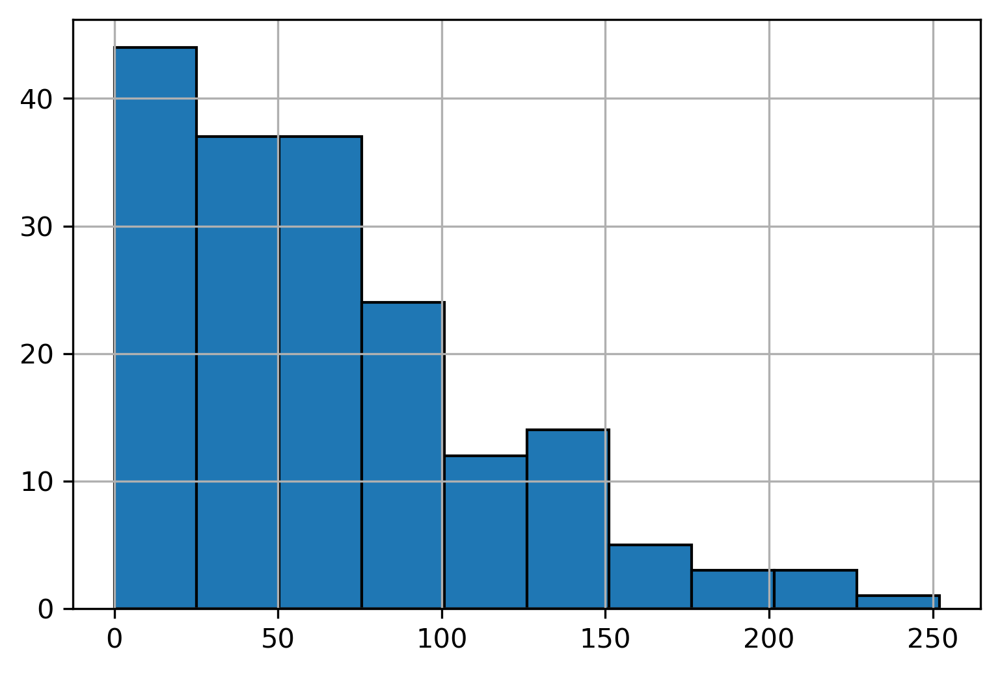

In [191]:
%time

# @numba.jit
def apply_get_LoG(row):
    img = _blob.preprocess_image(row['image'], row['channel'])
    return _blob.get_LoG_blobs(img, row['channel'])


exp.df['LoG_blobs']  = exp.df.apply(lambda x: apply_get_LoG(x), axis = 1)

# get counts
exp.df['n_blobs_count_1'] = exp.df['LoG_blobs'].apply(len)
exp.df['n_blobs_count_1'].hist(edgecolor='black')

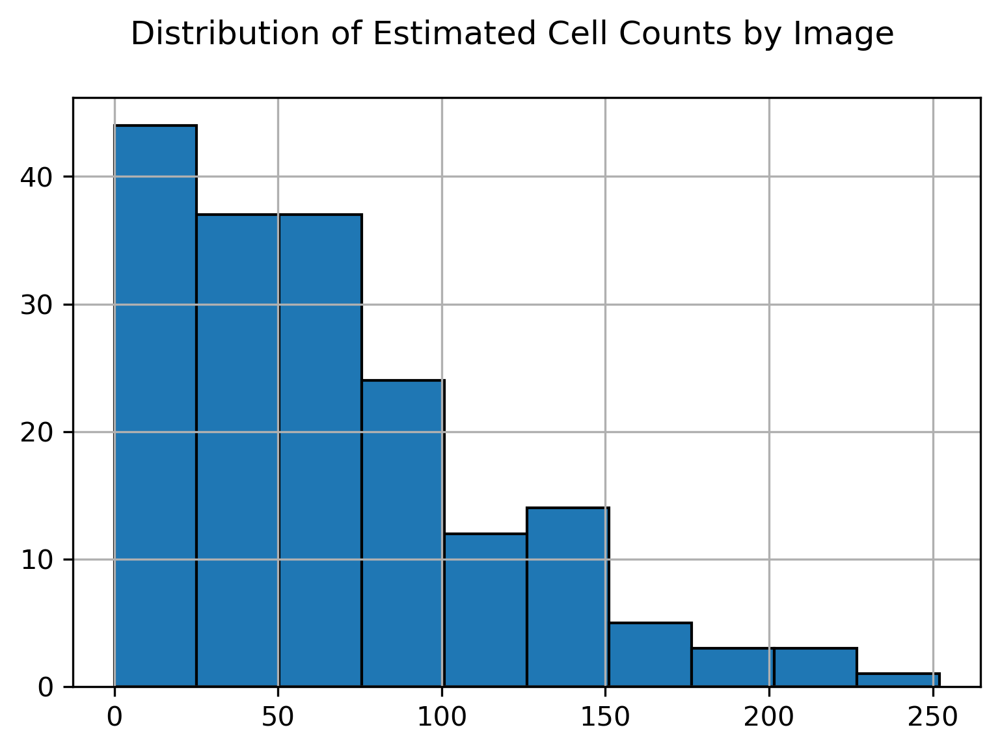

In [192]:
exp.df['n_blobs_count_1'].hist(edgecolor='black')
plt.suptitle("Distribution of Estimated Cell Counts by Image")
plt.savefig("figs/cell_count_histogram.png", bbox_inches='tight')

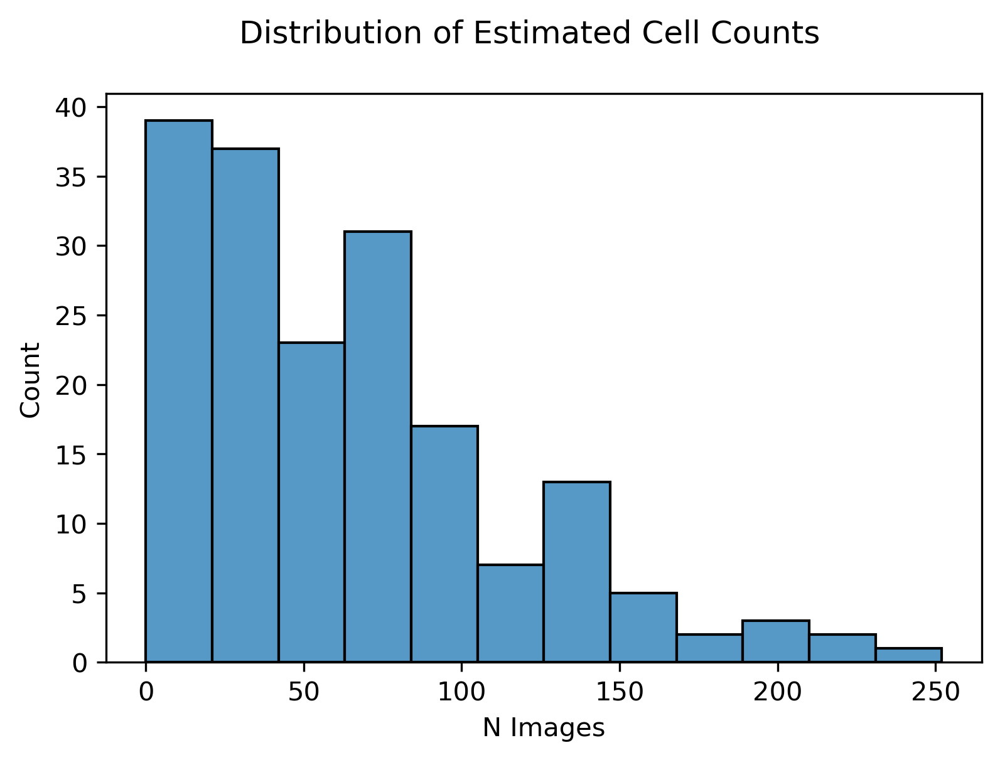

In [193]:
sns.histplot(data=exp.df, x='n_blobs_count_1')

plt.suptitle("Distribution of Estimated Cell Counts")
plt.xlabel("N Images")
plt.savefig("figs/cell_count_histogram.png", bbox_inches='tight')

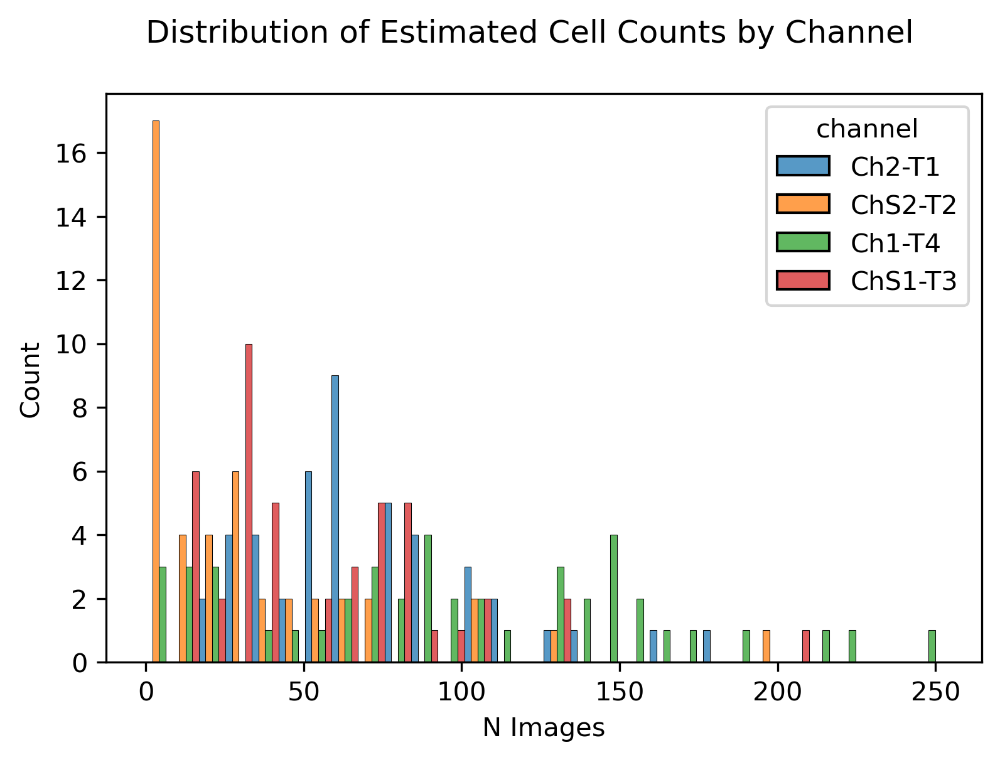

In [194]:
sns.histplot(x='n_blobs_count_1', data=exp.df, hue='channel', multiple="dodge",bins=30)
plt.xlabel("N Images")
plt.suptitle("Distribution of Estimated Cell Counts by Channel")
plt.savefig("figs/cell_count_histogram_by_channel.png", bbox_inches='tight')

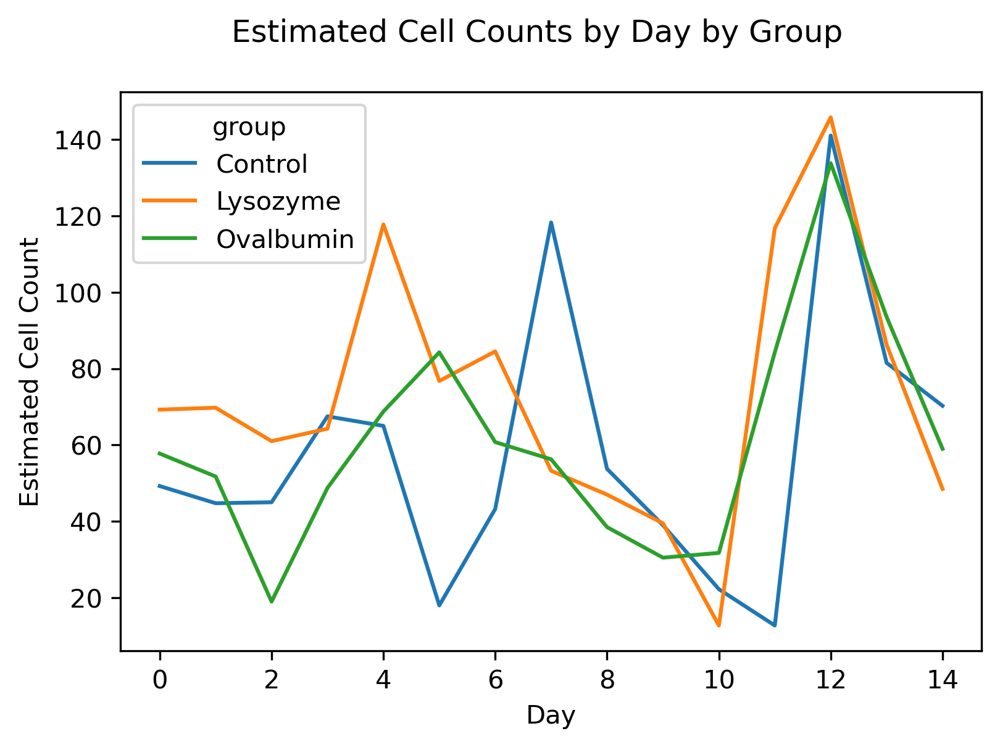

In [268]:
grouped_by_file = exp.df.groupby(['group', 'day'], as_index=False)['n_blobs_count_1'].mean()

sns.lineplot(x='day',
             y='n_blobs_count_1',
             hue='group',
             data=grouped_by_file)

plt.suptitle("Estimated Cell Counts by Day by Group")
plt.ylabel("Estimated Cell Count")
plt.xlabel("Day")
plt.savefig("figs/cell_count_by_day.png", bbox_inches='tight')

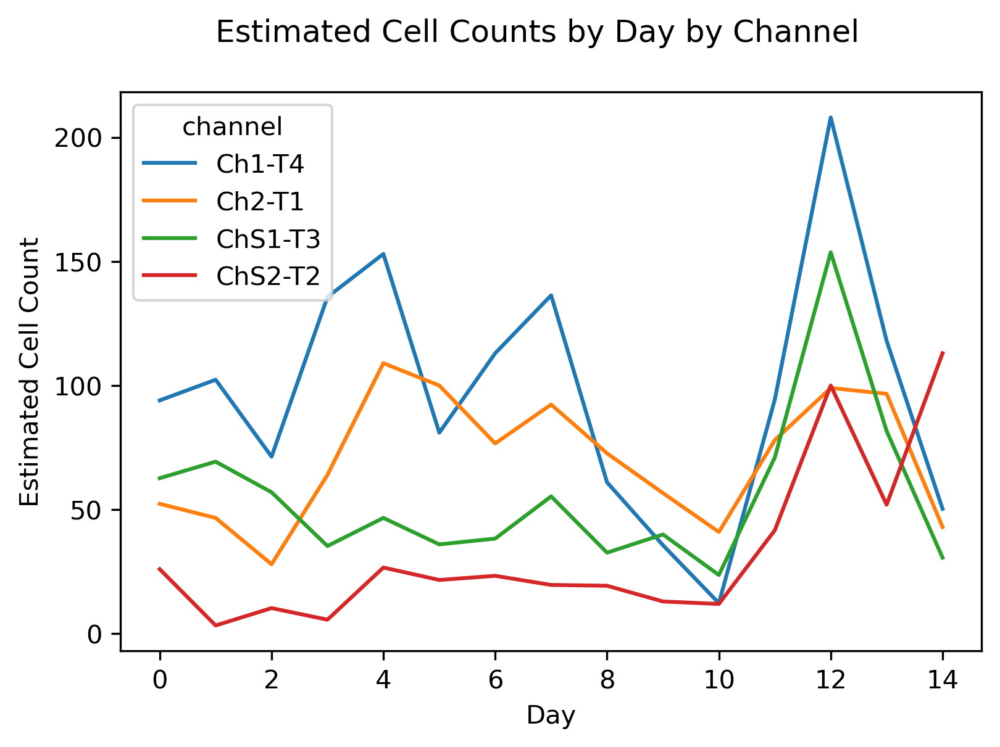

In [269]:
grouped_by_file = exp.df.groupby(['channel', 'day'], as_index=False)['n_blobs_count_1'].mean()

sns.lineplot(x='day',
             y='n_blobs_count_1',
             hue='channel',
             data=grouped_by_file)

plt.suptitle("Estimated Cell Counts by Day by Channel")
plt.ylabel("Estimated Cell Count")
plt.xlabel("Day")
plt.savefig("figs/cell_count_by_channel_day.png", bbox_inches='tight')

In [244]:
exp.df.head()

,channel,day,filename,group,image,LoG_blobs,n_blobs_count_1,channel_color
0,Ch2-T1,12,Control Day 12_Ch2-T1.png,Control,"[[0.0075, 0.0016666666666666666, 0.00166666666...","[[974.0, 715.0, 7.0710678118654755], [972.0, 2...",80,red
1,ChS2-T2,4,Lysozyme Day 4_ChS2-T2.png,Lysozyme,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0400270...","[[1007.0, 288.0, 7.0710678118654755], [948.0, ...",70,yellow
2,ChS2-T2,9,Control Day 9_ChS2-T2.png,Control,"[[0.0, 0.02183294117647059, 0.0218329411764705...","[[986.0, 1004.0, 7.0710678118654755], [916.0, ...",21,yellow
3,Ch1-T4,14,Ovalbumin Day 14_Ch1-T4.png,Ovalbumin,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[520.0, 170.0, 7.0710678118654755], [315.0, 2...",3,cyan
4,Ch1-T4,12,Lysozyme Day 12_Ch1-T4.png,Lysozyme,"[[0.018529411764705885, 0.052500000000000005, ...","[[1005.0, 433.0, 7.0710678118654755], [1004.0,...",219,cyan


Text(0.5, 1.0, 'Control, day 7')

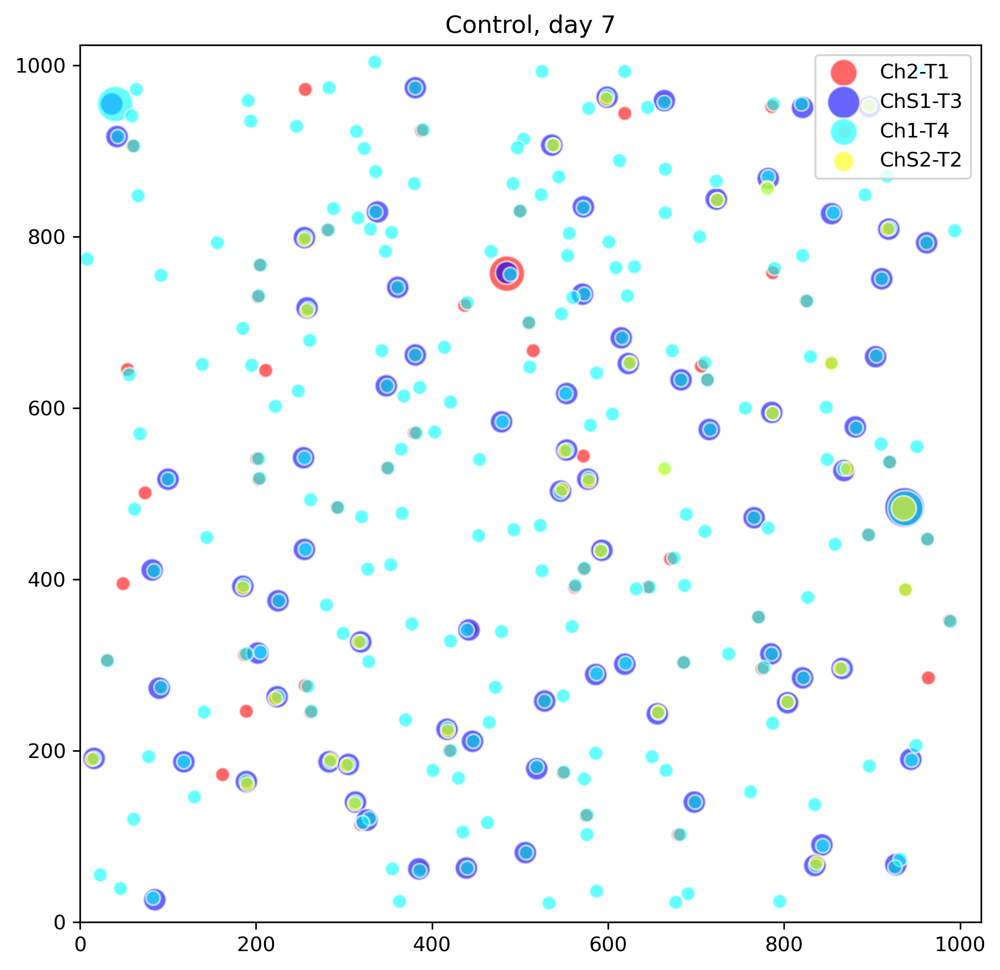

In [270]:
"""
start determining overlap
"""

rand_day = np.random.choice(exp.df['day'], 1)[0]
rand_group = np.random.choice(exp.df['group'], 1)[0]

group_subset = exp.df[(exp.df['day'] == rand_day) & (exp.df['group'] == rand_group)]

matplotlib.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim([0,1024])
ax.set_ylim([0,1024])

for idx, row in group_subset.iterrows():
    _color = row['channel_color']

    # ax.imshow(row['image'], cmap='gray', alpha=0.5)

    ax.scatter(row['LoG_blobs'][:,1], 
               row['LoG_blobs'][:,0], 
               s=row['LoG_blobs'][:,2]**2, 
               marker='o', 
               edgecolor='white',
               alpha=0.3,
               color=_color,
               label=row['channel'])


plt.legend()
plt.title(f"{rand_group}, day {rand_day}")
# plt.savefig(f"figs/{rand_group} day {rand_day}_points.png", bbox_inches='tight')
